In [1]:
import numpy as np
from datetime import datetime, timedelta
from pyproj import Proj
import xarray
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import os
import sys
from matplotlib.animation import FuncAnimation
import glob

In [2]:
goes_ims = os.listdir('July2018/july_6_187')
plfile = []
for fl in goes_ims:
    if 's2018187' in fl:
        plfile.append('July2018/july_6_187/'+fl)

In [3]:
plfile
plfile.sort()
print(plfile)

['July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871802228_e20181871805001_c20181871805112.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871807228_e20181871810001_c20181871810115.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871812228_e20181871815001_c20181871815107.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871817228_e20181871820001_c20181871820117.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871822228_e20181871825001_c20181871825117.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871827228_e20181871830001_c20181871830113.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871832228_e20181871835001_c20181871835116.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871837228_e20181871840001_c20181871840116.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871842228_e20181871845001_c20181871845106.nc', 'July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871847228_e20181871850001_c20181871850116.nc', 'July2018/july_6_18

In [2]:
import pyart
from pyart.core import geographic_to_cartesian_aeqd, Grid
import cartopy.crs as ccrs
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import netCDF4
import itertools
import glob
import os
from scipy import interpolate


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



/home/bbrock/.conda/envs/clouds_env/lib/python3.6/site-packages/pyart/graph/cm.py:104: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'red' in spec:
/home/bbrock/.conda/envs/clouds_env/lib/python3.6/site-packages/pyart/graph/cm_colorblind.py:32: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if 'red' in spec:


In [5]:
def _nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def interp_lonlat(lon, lat, data, radar_lon, radar_lat, grid_x, grid_y):
    x, y = geographic_to_cartesian_aeqd(lon, lat, radar_lon, radar_lat)

    target_x, target_y = np.meshgrid(grid_x, grid_y)
    points = list(zip(x.flatten(), y.flatten()))
    values = data.flatten()
    interp_data = interpolate.griddata(points, values, (target_x, target_y))
    interp_data = ma.masked_where(np.isnan(interp_data), interp_data)
    interp_data = np.tile(interp_data, (2, 1, 1))
    interp_data = interp_data[np.newaxis, :, :, :]
    return interp_data

In [6]:
def get_grid(filename, grid_x, grid_y, grid_z, output_dir):
    print('Gridding... ' + filename)
    
    # Reading in the GOES netCDF files
    nc = netCDF4.Dataset(filename)
    
    
    sat_height = nc.variables['goes_imager_projection'].perspective_point_height
    _x = nc.variables['x'] * sat_height
    _y = nc.variables['y'] * sat_height
    _c = nc.variables['CMI_C13'][:] * -1
    
    _x = np.resize(_x, 1500)
    #_y = np.resize(_y, 1500)
    
    data = nc.variables['CMI_C13']
    
    proj_var = nc.variables[data.grid_mapping]
    
    globe = ccrs.Globe(ellipse='sphere', semimajor_axis=proj_var.semi_major_axis,
                       semiminor_axis=proj_var.semi_minor_axis)
    
    proj = ccrs.Geostationary(central_longitude=-75,sweep_axis='x',
                              satellite_height=sat_height, globe = globe)
    
    trans = ccrs.PlateCarree(central_longitude=0)
    
    transform_xy = trans.transform_points(proj, _x, _y)
    
    #lim = [_nearest(transform_xy[:,0],-103),_nearest(transform_xy[:,0],-92)
            #,_nearest(transform_xy[:,1],42),_nearest(transform_xy[:,1],30)]
    
    lim = [_nearest(transform_xy[:,0],-99),_nearest(transform_xy[:,0],-93)
            ,_nearest(transform_xy[:,1],32),_nearest(transform_xy[:,1],27)]
    
    
    x = _x[lim[0]:lim[1]]
    y = _y[lim[2]:lim[3]]
    
    c = _c[lim[2]:lim[3],lim[0]:lim[1]]
        
    x_mesh, y_mesh = np.meshgrid(x, y)
    
    lonlat = trans.transform_points(proj, x_mesh, y_mesh)
    lons = lonlat[:, :, 0]
    lats = lonlat[:, :, 1]
    
    # Values are from the KVNX radar
    # KVNX data was used becuase original project this was used for 
    # was using that radar to compare GOES data to the radar data
    #radar_lon = -95.07873535
    radar_lon = -95.5
    #radar_lat = 29.47190094
    radar_lat = 29
    #radar_alt = 35.0
    radar_alt = 150
    
    interp_c = interp_lonlat(lons, lats, c,
                             radar_lon, radar_lat, grid_x, grid_y) 
    
    # Creating the data dictonaries needed for the PyART grid function
    # radar_latitude, radar_longitude, and radar_altitude are not required for
    # gridding, but to work with TINT they are needed. 
    _time = {'calendar': 'gregorian','data': np.array([ 0.934]),
             'long_name': 'Time of grid', 'standard_name': 'time',
             'units': str('seconds since ' + nc.time_coverage_end)}
    
#    _fields = {'reflectivity': {'_FillValue': -9999.0, 'data': ma.masked_array(c, mask= False),
#                       'long_name': 'reflectivity',
#                       'standard_name': 'equivalent_reflectivity_factor',
#                       'units': 'dBZ', 'valid_max': c.max(), 'valid_min': c.min()}}
    
    _fields = {'c13': {'_FillValue': -9999.0,
                       'data': interp_c,
                       'long_name': 'channel 13 10.3 microns K',
                       'standard_name': 'c13',
                       'units': 'K', 'valid_max': c.max(),
                       'valid_min': c.min()}}
    
    _metadata = {'Conventions': '', 'comment': '',
                 'history': '', 'institution': '', 'instrument_name': '',
                 'original_container': 'NEXRAD Level II', 'references': '',
                 'source': '', 'title': '', 'vcp_pattern': '', 'version': ''}
    
    _origin_latitude = {'data': ma.array([radar_lat]),
                        'long_name': 'Latitude at grid origin',
                        'standard_name': 'latitude',
                        'units': 'degrees_north', 'valid_max': 90.0,
                        'valid_min': -90.0}
    
    _radar_latitude = {'data': ma.array([radar_lat]),
                       'long_name': 'Latitude of radar used to make the grid',
                       'units': 'degrees_north',
                       'standard_name': 'latitude'}
    
    _origin_longitude = {'data': ma.array([radar_lon]), 
                         'long_name': 'Longitude at grid origin', 
                         'standard_name': 'longitude', 'units': 'degrees_east', 
                         'valid_max': 180.0, 'valid_min': -180.0}
    
    _radar_longitude = {'data': ma.array([radar_lon]),
                        'standard_name': 'longitude',
                        'long_name': 'Longitude of radars used to make the grid',
                        'units': 'degrees_east'}
    
    _origin_altitude = {'data': ma.array([radar_alt]), 
                        'long_name': 'Altitude at grid origin', 
                        'standard_name': 'altitude', 'units': 'm'}
    
    _radar_altitude = {'data': ma.array([radar_alt]),
                       'long_name': 'Altitude of radars used to make the grid',
                       'units': 'm', 'standard_name': 'altitude'}
    
    _x = {'axis': 'X', 'data': grid_x, 
          'long_name': 'X distance on the projection plane from the origin', 
          'standard_name': 'projection_x_coordinate', 'units': 'm'}
    
    _y = {'axis': 'Y', 'data': grid_y, 
          'long_name': 'Y distance on the projection plane from the origin', 
          'standard_name': 'projection_x_coordinate', 'units': 'm'}
    
#     _z = {'axis': 'Z', 'data': grid_z,
#           'long_name': 'Z distance on the projection plane from the origin',
#           'positive': 'up', 'standard_name': 'projection_z_coordinate',
#           'units': 'm'}
    
    _z = {'axis': 'Z', 'data': ma.array([0, grid_z]),
          'long_name': 'Z distance on the projection plane from the origin',
          'positive': 'up', 'standard_name': 'projection_z_coordinate',
          'units': 'm'}
    
    # Creating and saving GOES grid using PyARTs gridding function
    # Grid documentation can be found here:
    # https://github.com/ARM-DOE/pyart/blob/master/pyart/core/grid.py
    grid = Grid(time=_time, fields=_fields, metadata=_metadata,
                origin_latitude=_origin_latitude, origin_longitude=_origin_longitude,
                origin_altitude=_origin_altitude, x=_x, y=_y, z=_z,
                radar_longitude=_radar_longitude, radar_latitude=_radar_latitude,
                radar_altitude=_radar_altitude)
    
    grid_name = os.path.basename(filename[:-3] + '_grid.nc')
    full_name = os.path.join(output_dir, grid_name)
    pyart.io.write_grid(full_name, grid)

In [7]:
# Setting the variables needed for get_grid and then creating grids
# grid_x, grid_y, grid_z can be changed to any values those are just what we used
grid_x = np.linspace(-200000, 200000, 500)
grid_y = np.linspace(-200000, 200000, 500)
#grid_z = np.linspace(0,15000,31)
grid_z = grid_x[1] - grid_x[0]
output_dir = '/home/bbrock/Desktop/July2018/july_6_gridding'
#output_dir = '/home/bbrock/Desktop/temp_attempt/Gridding'

# Pulling the GOES data that is going to be gridded using glob
filename = glob.glob('/home/bbrock/Desktop/July2018/july_6_187/OR*')
#filename = glob.glob('/home/bbrock/Desktop/temp_attempt/OR*')
filename.sort()

# For loop for gridding the GOES data
for file in filename:
    get_grid(filename=file, grid_x=grid_x, 
             grid_y=grid_y, grid_z=grid_z, 
             output_dir=output_dir)
print('Gridding Complete')

Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871802228_e20181871805001_c20181871805112.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871807228_e20181871810001_c20181871810115.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871812228_e20181871815001_c20181871815107.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871817228_e20181871820001_c20181871820117.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871822228_e20181871825001_c20181871825117.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871827228_e20181871830001_c20181871830113.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871832228_e20181871835001_c20181871835116.nc
Gridding... /home/bbrock/Desktop/July2018/july_6_187/OR_ABI-L2-MCMIPC-M3_G16_s20181871837228_e2018187184

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.animation import FuncAnimation
import glob
import pyart 
import shutil
from tint.tracks import Cell_tracks
from tint.visualization import animate, embed_mp4_as_gif
import os

In [8]:
# Creating custom colormap to use on sat animation and tracking plots


vmin = 198
vmax = 320
lcl = 269.5


colormap = pyart.graph.cm_colorblind.HomeyerRainbow
colors2 = colormap(np.linspace(0, 1, int(((250-vmin)/(vmax-vmin))*1000)))
colors3 = plt.cm.Greys_r(np.linspace(.3, .5, int(((lcl-250)/(vmax-vmin))*1000)))
colors4 = plt.cm.Greys_r(np.linspace(.15, .2, int(((vmax-lcl)/(vmax-vmin))*1000)))
colors = np.vstack((colors4, colors3, colors2))
mymap = mcolors.LinearSegmentedColormap.from_list('my_colormap', colors)

In [9]:
# Creating an animation of the GOES grids using PyART
all_files = glob.glob('/home/bbrock/Desktop/July2018/july_6_gridding/*')
#all_files = glob.glob('/home/bbrock/Desktop/temp_attempt/Gridding/*')
all_files.sort()
files = all_files[0:60]

In [10]:
files

['/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871802228_e20181871805001_c20181871805112_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871807228_e20181871810001_c20181871810115_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871812228_e20181871815001_c20181871815107_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871817228_e20181871820001_c20181871820117_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871822228_e20181871825001_c20181871825117_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871827228_e20181871830001_c20181871830113_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871832228_e20181871835001_c20181871835116_grid.nc',
 '/home/bbrock/Desktop/July2018/july_6_gridding/OR_ABI-L2-MCMIPC-M3_G16_s20181871837228_e2

In [12]:
def sat_animation(nframe):
    plt.clf()
    nfile = files[nframe]
    
    grid = pyart.io.read_grid(nfile)
    
    display = pyart.graph.GridMapDisplay(grid)
    display.plot_grid('c13', vmin=-320, vmax=-200)
                      #lat_lines=np.arange(30, 31.75, .25),
                      #lon_lines=np.arange(-98.5, -95.5, .5))
    del grid, display

fig = plt.figure(figsize=[12, 8])
sat_anim = FuncAnimation(fig, sat_animation, frames=len(files))
sat_anim.save('/home/bbrock/Desktop/July2018/sat_animation.gif',
              writer='imagemagick', fps=3)
#sat_anim.save('/home/bbrock/Desktop/temp_attempt/sat_animation.gif',
              #writer='imagemagick', fps=3)
plt.show()
plt.close

ValueError: Image size of 61988472x-570086737 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 864x576 with 2 Axes>

<function matplotlib.pyplot.close(fig=None)>

In [11]:
data_dir = '/home/bbrock/Desktop/July2018/july_6_gridding/OR_*'
grid_files = glob.glob(data_dir, recursive=True)
grid_files.sort()
len(grid_files)

60

In [12]:
# Creating a grid generator to be able to read the goes grids into TINT
grid_gen = (pyart.io.read_grid(grid_name) for grid_name in grid_files)

# Instantiate tracks object and view parameter defaults
tracks_obj = Cell_tracks(field='c13')

# Adjusting size parameter
# Default parameter values and documentation can be found in TINT
# https://github.com/openradar/TINT/blob/master/tint/tracks.py
tracks_obj.params['FIELD_THRESH'] = -230 
tracks_obj.params['FLOW_MARGIN'] = 10000
tracks_obj.params['GS_ALT'] = 0
tracks_obj.params['ISO_SMOOTH'] = 3
tracks_obj.params['ISO_THRESH'] = 16
tracks_obj.params['MAX_DISPARITY'] = 999
tracks_obj.params['MAX_FLOW_MAG'] = 50
tracks_obj.params['MAX_SHIFT_DISP'] = 15
tracks_obj.params['MIN_SIZE'] = 32
tracks_obj.params['SEARCH_MARGIN'] = 4000

# Printing parameter values to screen
# print(tracks_obj.params)

# Get tracks from grid generator
tracks_obj.get_tracks(grid_gen)

Writing tracks for scan 0
Writing tracks for scan 1
Writing tracks for scan 2
Writing tracks for scan 3
Writing tracks for scan 4
Writing tracks for scan 5
Writing tracks for scan 6
Writing tracks for scan 7
Writing tracks for scan 8
Writing tracks for scan 9
Writing tracks for scan 10
Writing tracks for scan 11
Writing tracks for scan 12
Writing tracks for scan 13
Writing tracks for scan 14
Writing tracks for scan 15
Writing tracks for scan 16
Writing tracks for scan 17
Writing tracks for scan 18
Writing tracks for scan 19
Writing tracks for scan 20
Writing tracks for scan 21
Writing tracks for scan 22
Writing tracks for scan 23
Writing tracks for scan 24
Writing tracks for scan 25
Writing tracks for scan 26
Writing tracks for scan 27
Writing tracks for scan 28
Writing tracks for scan 29
Writing tracks for scan 30
Writing tracks for scan 31
Writing tracks for scan 32
Writing tracks for scan 33
Writing tracks for scan 34
Writing tracks for scan 35
Writing tracks for scan 36
Writing tra

In [13]:
# Creating a grid generator to be able to read the grids into TINT
anim_gen = (pyart.io.read_grid(grid_name) for grid_name in grid_files)

# Create animation and saving it to a specific location
animate(tracks_obj, anim_gen, '/home/bbrock/Desktop/July2018/sat_tracks1',
        keep_frames=True, vmin = -320, vmax = -198, cmap = mymap, tracers=True)

Animating 60 frames
Frame: 0
Frame: 1
Frame: 2
Frame: 3
Frame: 4
Frame: 5
Frame: 6
Frame: 7
Frame: 8
Frame: 9
Frame: 10
Frame: 11
Frame: 12
Frame: 13
Frame: 14
Frame: 15
Frame: 16
Frame: 17
Frame: 18
Frame: 19
Frame: 20
Frame: 21
Frame: 22
Frame: 23
Frame: 24
Frame: 25
Frame: 26
Frame: 27
Frame: 28
Frame: 29
Frame: 30
Frame: 31
Frame: 32
Frame: 33
Frame: 34
Frame: 35
Frame: 36
Frame: 37
Frame: 38
Frame: 39
Frame: 40
Frame: 41
Frame: 42
Frame: 43
Frame: 44
Frame: 45
Frame: 46
Frame: 47
Frame: 48
Frame: 49
Frame: 50
Frame: 51
Frame: 52
Frame: 53
Frame: 54
Frame: 55
Frame: 56
Frame: 57
Frame: 58
Frame: 59


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/bbrock/.conda/envs/clouds_env/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3296, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-13-f57de412b1ff>", line 6, in <module>
    keep_frames=True, vmin = -320, vmax = -198, cmap = mymap, tracers=True)
  File "/home/bbrock/dev/TINT/tint/visualization.py", line 326, in animate
    shutil.copytree(tmp_dir, frame_dir)
  File "/home/bbrock/.conda/envs/clouds_env/lib/python3.6/shutil.py", line 315, in copytree
    os.makedirs(dst)
  File "/home/bbrock/.conda/envs/clouds_env/lib/python3.6/os.py", line 220, in makedirs
    mkdir(name, mode)
FileExistsError: [Errno 17] File exists: '/home/bbrock/Desktop/July2018/sat_tracks1_frames'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/bbrock/.conda/envs/clouds_env/lib/python3.6/site-packages/IPython/core/interactiveshell.py", l

FileExistsError: [Errno 17] File exists: '/home/bbrock/Desktop/July2018/sat_tracks1_frames'

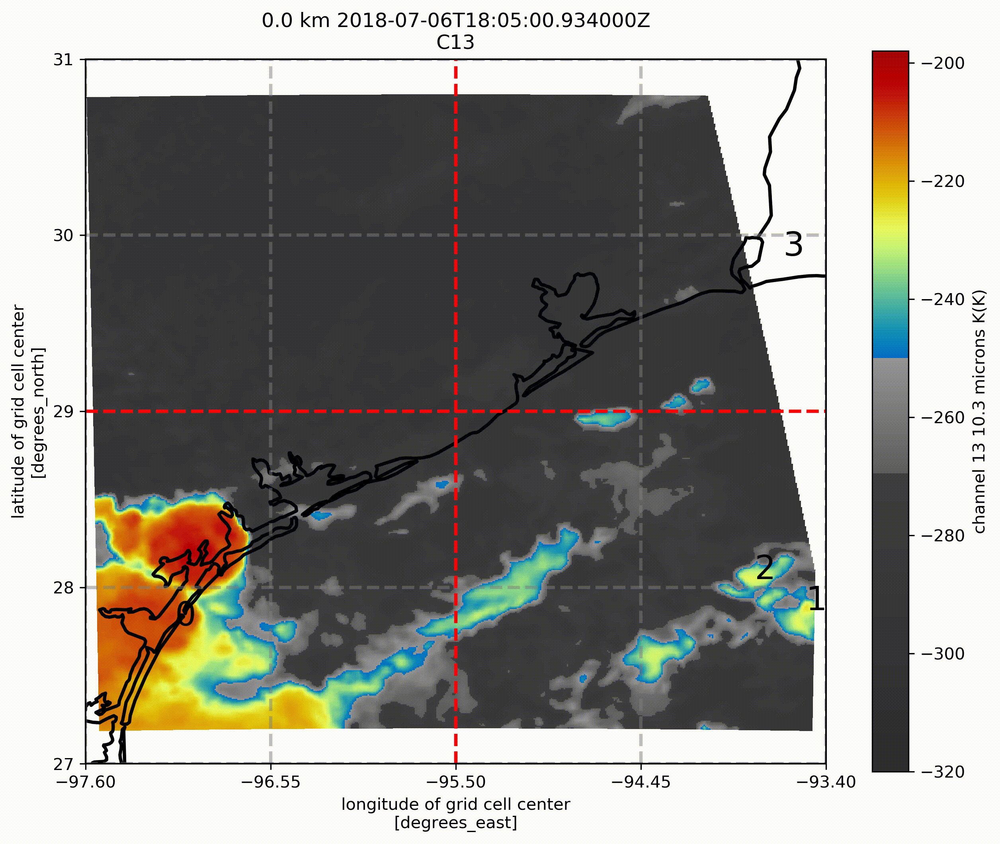

In [14]:
# Displaying TINT tracks
embed_mp4_as_gif('/home/bbrock/Desktop/July2018/sat_tracks1.mp4')